<a href="https://colab.research.google.com/github/kumarprabhakaran11/OccuapncyEstimation/blob/main/Occupancy_Estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal Component Analysis and diagnosis of Breast cancer**

**Install Pycaret**

In [11]:
!pip install pycaret==2.3.6


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Import Libraries**

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [13]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**

The “Breast Cancer diagnosis Data Set” used for Principle Component Analysis (PCA) and classification models is obtained from Kaggle. The data set provided information about tumor attributes to diagnosed it as benign or malignant for breast cancer.

There are 5 attributes with 569 entries and one column for classification. 
**0 represents Benign and 1 represents Malignant.**


All attributes are numerical and they are listed bellow:

1. mean_radius = MR
2. mean_texture = MT
3. mean_perimeter = MP
4. mean_area = MA
5. mean_smoothness = MS
6. diagnosis (Label)

The original dataset can be found on below link:
https://www.kaggle.com/datasets/theodoravalerie/breast-cancer-data





In [14]:
import io
%matplotlib inline
df = pd.read_csv('https://raw.githubusercontent.com/kumarprabhakaran11/OccuapncyEstimation/main/Occupancy_Estimation6.csv')
df.head(25)

,S1_Temp,S2_Temp,S3_Temp,S4_Temp,S3_Light,S4_Light,S4_Sound,S6_PIR,S7_PIR,day_type,Time_of_day,Room_Occupancy_Count
0,24.94,24.75,24.56,25.38,53,40,0.06,0,0,1,1,1
1,24.94,24.75,24.56,25.44,53,40,0.06,0,0,1,1,1
2,25.00,24.75,24.50,25.44,53,40,0.06,0,0,1,1,1
3,25.00,24.75,24.56,25.44,53,40,0.09,0,0,1,1,1
4,25.00,24.75,24.56,25.44,54,40,0.06,0,0,1,1,1
5,25.00,24.81,24.56,25.44,54,40,0.07,0,0,1,1,1
6,25.00,24.75,24.56,25.44,54,40,0.06,1,0,1,1,1
7,25.00,24.81,24.56,25.44,54,41,0.05,0,0,1,1,1
8,25.00,24.81,24.56,25.50,56,43,0.13,0,0,1,1,1
9,25.00,24.81,24.56,25.50,57,43,0.39,1,1,1,1,1


In [15]:
len(df.index)

10129

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10129 entries, 0 to 10128
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   S1_Temp               10129 non-null  float64
 1   S2_Temp               10129 non-null  float64
 2   S3_Temp               10129 non-null  float64
 3   S4_Temp               10129 non-null  float64
 4   S3_Light              10129 non-null  int64  
 5   S4_Light              10129 non-null  int64  
 6   S4_Sound              10129 non-null  float64
 7   S6_PIR                10129 non-null  int64  
 8   S7_PIR                10129 non-null  int64  
 9   day_type              10129 non-null  int64  
 10  Time_of_day           10129 non-null  int64  
 11  Room_Occupancy_Count  10129 non-null  int64  
dtypes: float64(5), int64(7)
memory usage: 949.7 KB


In [17]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  4864


In [18]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

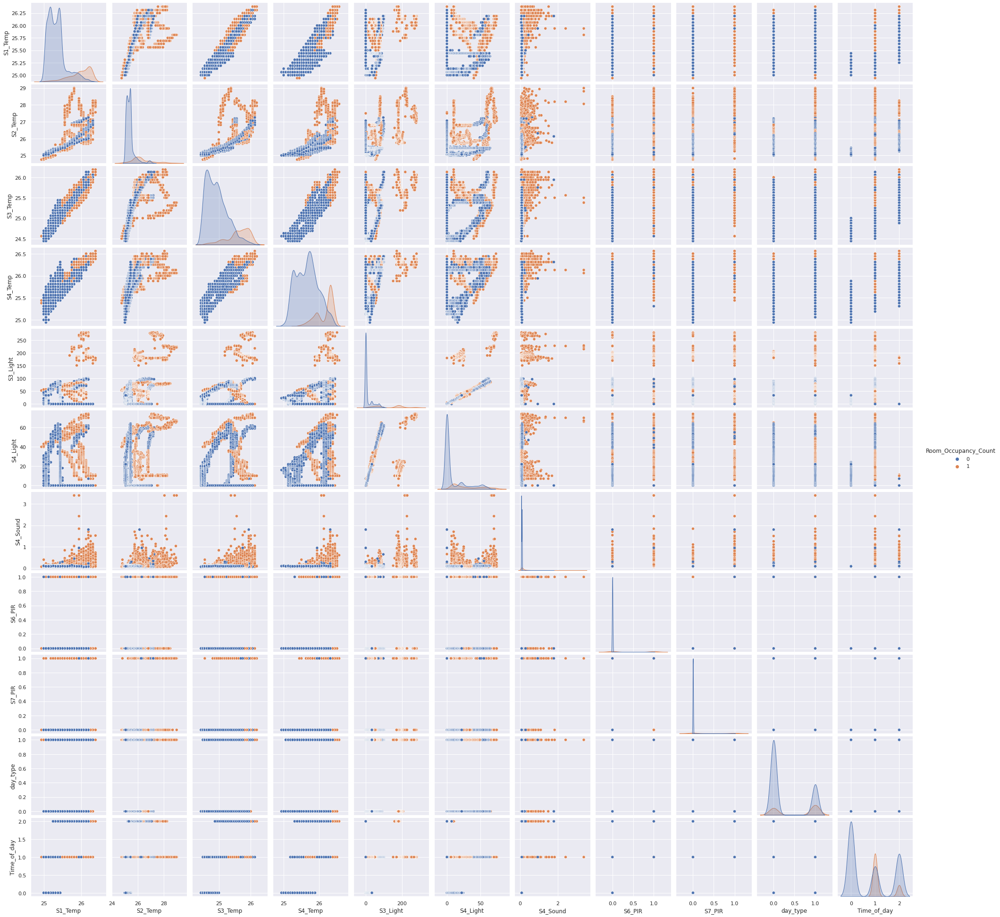

In [19]:
sns.pairplot(df, hue='Room_Occupancy_Count')
plt.show()

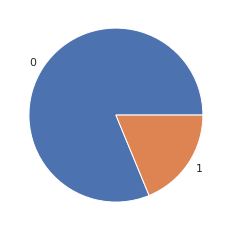

In [20]:
y =df['Room_Occupancy_Count']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [21]:
X = df.drop(columns=['Room_Occupancy_Count','S4_Sound','S6_PIR','S7_PIR'])
X.head(10)

,S1_Temp,S2_Temp,S3_Temp,S4_Temp,S3_Light,S4_Light,day_type,Time_of_day
0,24.94,24.75,24.56,25.38,53,40,1,1
1,24.94,24.75,24.56,25.44,53,40,1,1
2,25.00,24.75,24.50,25.44,53,40,1,1
3,25.00,24.75,24.56,25.44,53,40,1,1
4,25.00,24.75,24.56,25.44,54,40,1,1
5,25.00,24.81,24.56,25.44,54,40,1,1
6,25.00,24.75,24.56,25.44,54,40,1,1
7,25.00,24.81,24.56,25.44,54,41,1,1
8,25.00,24.81,24.56,25.50,56,43,1,1
9,25.00,24.81,24.56,25.50,57,43,1,1


In [22]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
S1_Temp,10129.0,25.454012,0.351351,24.94,25.19,25.38,25.63,26.38
S2_Temp,10129.0,25.546059,0.586325,24.75,25.19,25.38,25.63,29.00
S3_Temp,10129.0,25.056621,0.427283,24.44,24.69,24.94,25.38,26.19
S4_Temp,10129.0,25.754125,0.356434,24.94,25.44,25.75,26.00,26.56
S3_Light,10129.0,34.248494,58.400744,0.00,0.00,0.00,50.00,280.00
S4_Light,10129.0,13.220259,19.602219,0.00,0.00,0.00,22.00,74.00
day_type,10129.0,0.346234,0.475792,0.00,0.00,0.00,1.00,1.00
Time_of_day,10129.0,0.861388,0.816581,0.00,0.00,1.00,2.00,2.00


**Standardize the Data**

In [23]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,S1_Temp,S2_Temp,S3_Temp,S4_Temp,S3_Light,S4_Light,day_type,Time_of_day
0,-1.463033,-1.357775,-1.162334,-1.049684,0.321099,1.366226,1.374126,0.169755
1,-1.463033,-1.357775,-1.162334,-0.881342,0.321099,1.366226,1.374126,0.169755
2,-1.292255,-1.357775,-1.302764,-0.881342,0.321099,1.366226,1.374126,0.169755
3,-1.292255,-1.357775,-1.162334,-0.881342,0.321099,1.366226,1.374126,0.169755
4,-1.292255,-1.357775,-1.162334,-0.881342,0.338223,1.366226,1.374126,0.169755
5,-1.292255,-1.255438,-1.162334,-0.881342,0.338223,1.366226,1.374126,0.169755
6,-1.292255,-1.357775,-1.162334,-0.881342,0.338223,1.366226,1.374126,0.169755
7,-1.292255,-1.255438,-1.162334,-0.881342,0.338223,1.417243,1.374126,0.169755
8,-1.292255,-1.255438,-1.162334,-0.713000,0.372471,1.519278,1.374126,0.169755
9,-1.292255,-1.255438,-1.162334,-0.713000,0.389595,1.519278,1.374126,0.169755


In [24]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
S1_Temp,10129.0,-3.434512e-15,1.000049,-1.463033,-0.751458,-0.210661,0.500914,2.635640
S2_Temp,10129.0,5.533380e-15,1.000049,-1.357775,-0.607302,-0.283234,0.143172,5.891117
S3_Temp,10129.0,4.781379e-15,1.000049,-1.443193,-0.858071,-0.272949,0.756865,2.652660
S4_Temp,10129.0,-6.779233e-15,1.000049,-2.284195,-0.881342,-0.011573,0.689854,2.261049
S3_Light,10129.0,-4.489558e-17,1.000049,-0.586468,-0.586468,-0.586468,0.269727,4.208228
S4_Light,10129.0,-1.010151e-16,1.000049,-0.674460,-0.674460,-0.674460,0.447917,3.100809
day_type,10129.0,3.142691e-16,1.000049,-0.727735,-0.727735,-0.727735,1.374126,1.374126
Time_of_day,10129.0,-7.856727e-17,1.000049,-1.054924,-1.054924,0.169755,1.394435,1.394435


**Observations and variables**

In [25]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

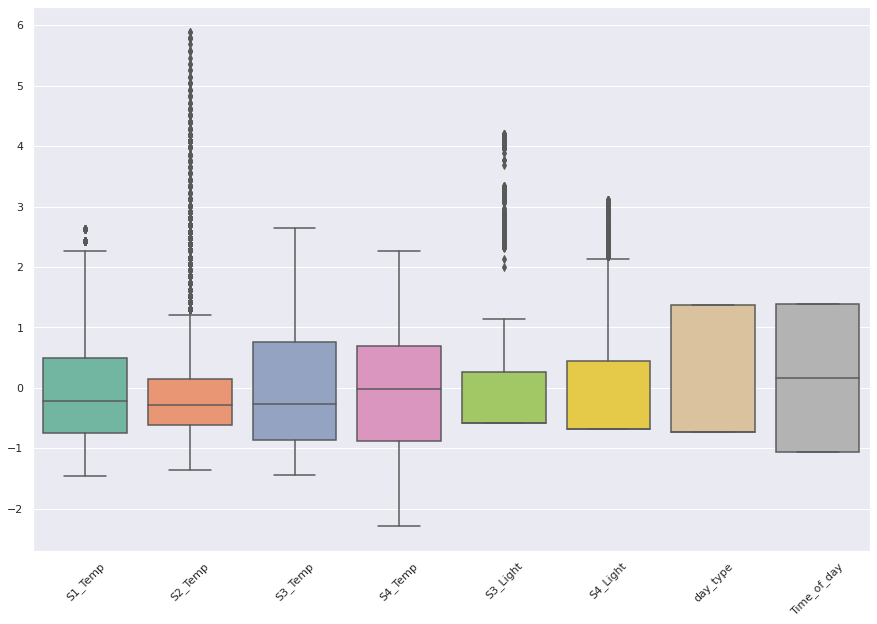

In [26]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

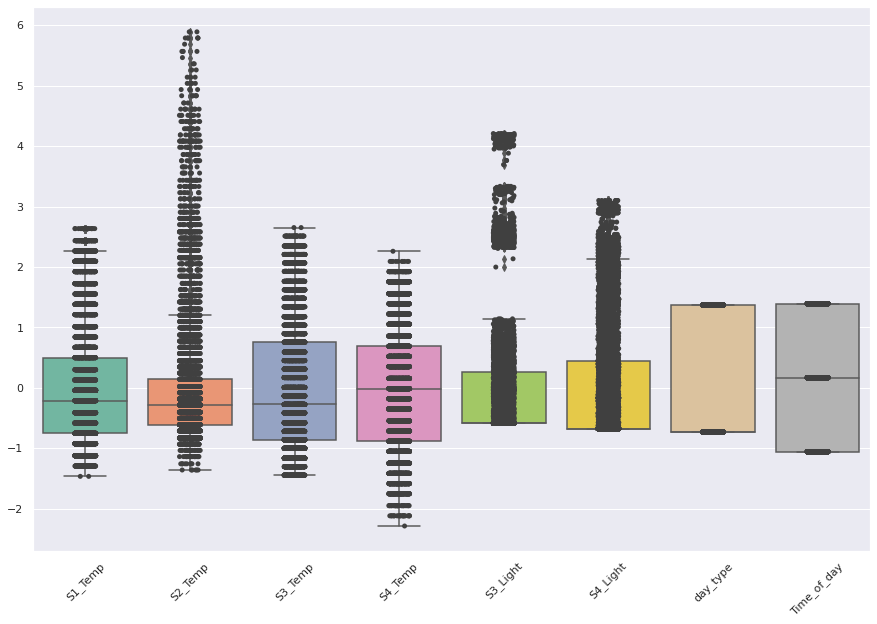

In [27]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

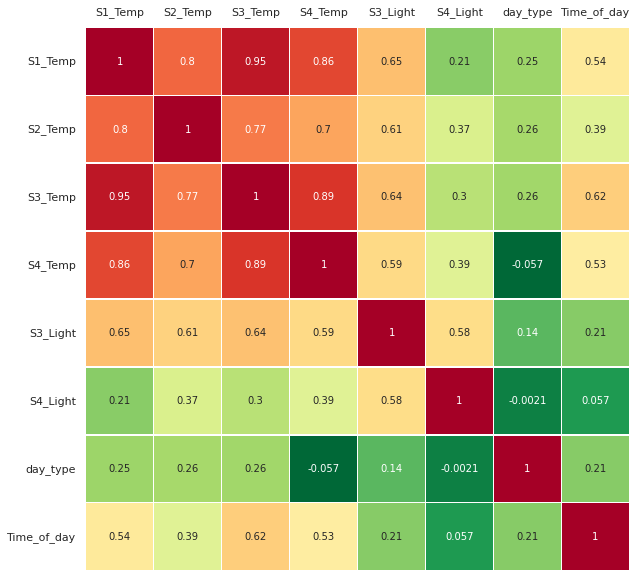

In [28]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

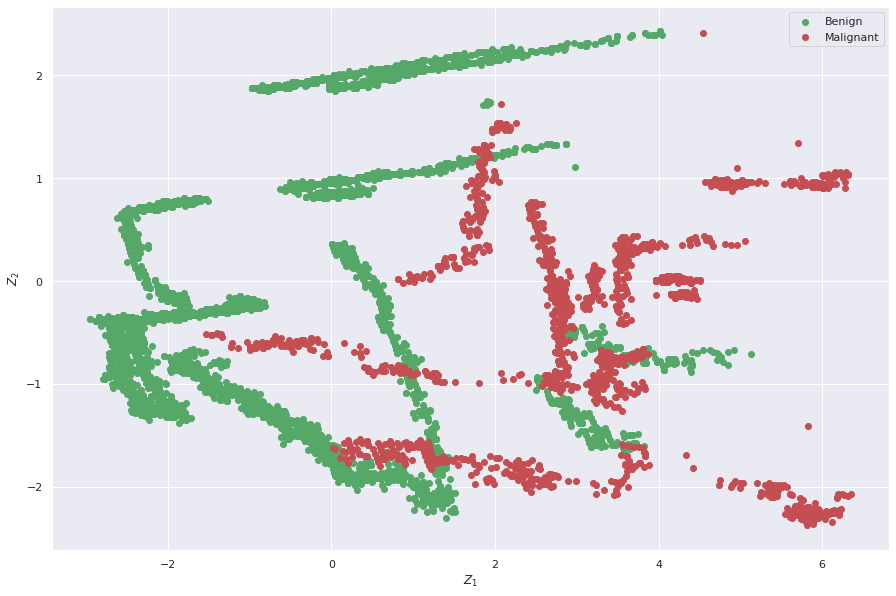

In [29]:
pca = PCA()
Z = pca.fit_transform(X)

# (Malignant)->1,  (Benign)->0

idx_Benign= np.where(y == 0)
idx_Malignant = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Benign')
plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='Malignant')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[ 0.44061306,  0.14644355, -0.08436609,  0.28209282, -0.07211486,
        -0.1536368 ,  0.48676938,  0.65724514],
       [ 0.40140985, -0.00576488,  0.12067993,  0.28776707,  0.62087718,
         0.57992325, -0.10075771, -0.09752849],
       [ 0.44924664,  0.12821206, -0.08438046,  0.07140917, -0.07152796,
        -0.30848325,  0.37352479, -0.72781925],
       [ 0.42003406, -0.08145919, -0.33470001,  0.03201771,  0.09257243,
        -0.44078561, -0.69994438,  0.10536987],
       [ 0.35591526, -0.36098924,  0.241208  ,  0.12054775, -0.71019082,
         0.36248285, -0.18204718, -0.03731006],
       [ 0.21480757, -0.63482024,  0.29548369, -0.54150184,  0.28016968,
        -0.19481217,  0.21101485,  0.09670578],
       [ 0.11624526,  0.48260903,  0.80182624, -0.06846854,  0.00301723,
        -0.24062776, -0.2136258 ,  0.04914768],
       [ 0.28310454,  0.43500078, -0.2660025 , -0.72044806, -0.11291552,
         0.35125998, -0.01249471,  0.06733353]])

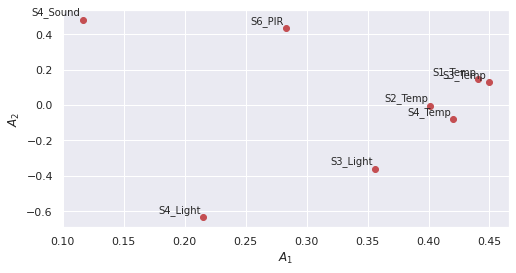

In [30]:
A = pca.components_.T 
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

/usr/local/lib/python3.8/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


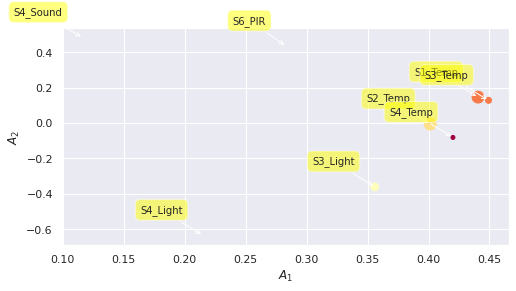

In [31]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([4.54982076, 1.23537655, 0.98274002, 0.57631556, 0.32632405,
       0.23235762, 0.06155386, 0.03630147])

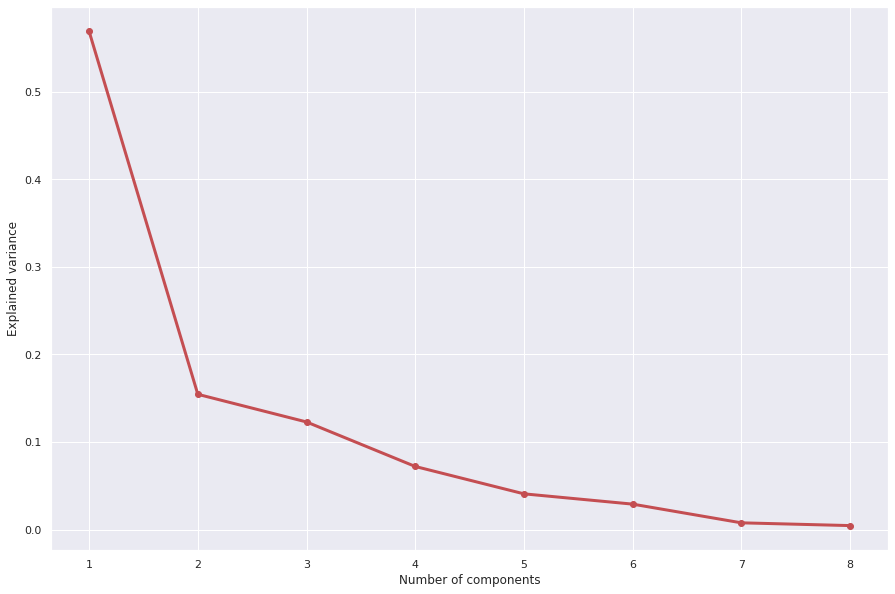

In [32]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

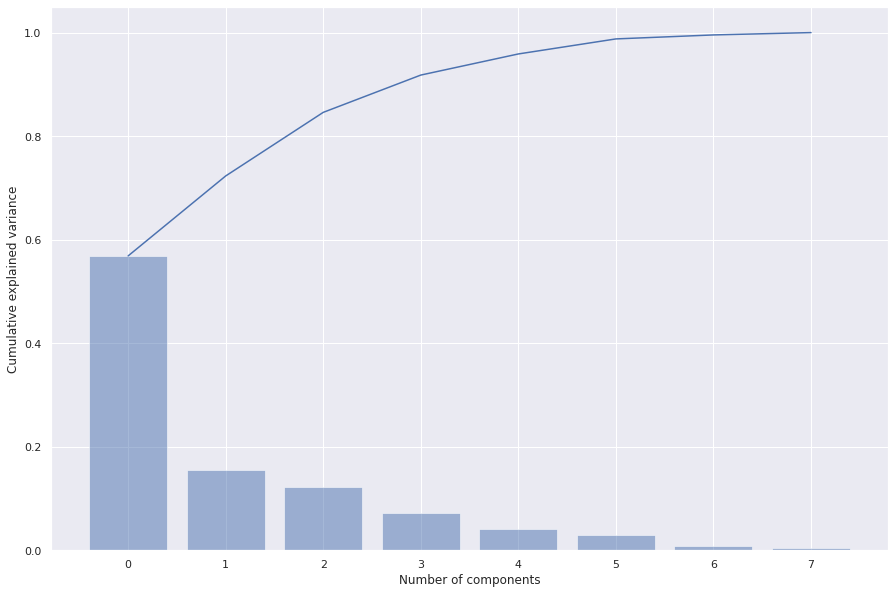

In [33]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([-0.5161551 , -0.52986814, -0.52286352, ..., -0.20361128,
       -0.20361128, -0.20361128])

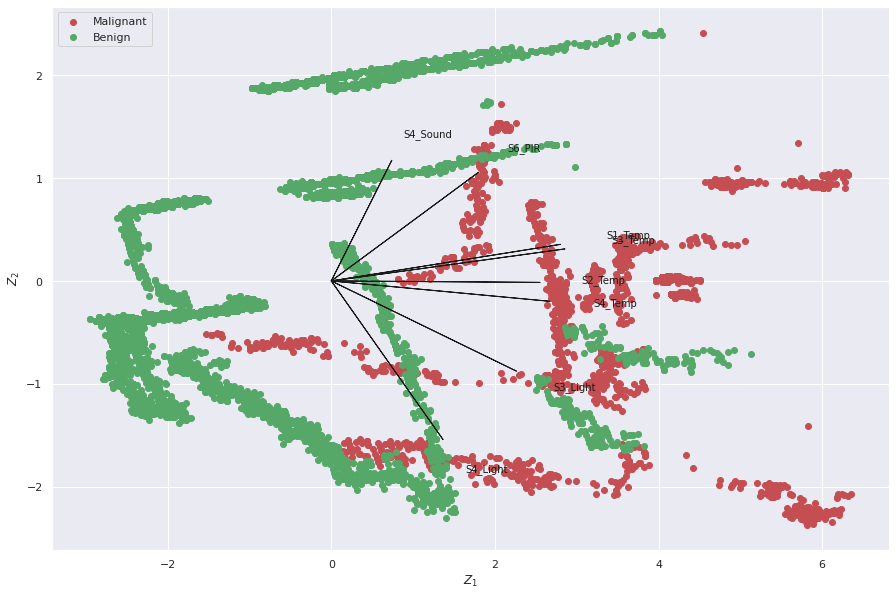

In [34]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='Malignant')
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Benign')

plt.legend(loc='upper left')
Z1
Z2

# **Using PCA Library**

In [35]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for adjustText: filename=adjustText-0.7.3-py3-none-any.whl size=7096 sha256=9e58956bf8c9dfb57173b8475efb30608cb1aa3c46a84a3ea7a89c13392ef5f5
  Stored in directory: /root/.cache/pip/wheels/06/b2/e0/b239bd2c0ff89b98c4f0c86a63e7059f38a8dfaf6df2641c63
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=698361535024fc8380da81f91f060e9fbc1131779e33acbf0c322395569d0269
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built adjustText wget


In [36]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [8] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [5] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [8] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[5]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [37]:
out['PC']

,PC1,PC2,PC3,PC4,PC5
0,-1.537180,-0.516155,1.946786,-1.837534,-0.611826
1,-1.466470,-0.529868,1.890442,-1.832144,-0.596242
2,-1.454311,-0.522864,1.887884,-1.793997,-0.598513
3,-1.391223,-0.504859,1.876034,-1.783969,-0.608558
4,-1.385129,-0.511040,1.880165,-1.781905,-0.620719
...,...,...,...,...,...
10124,-1.738188,-0.241009,2.008063,-0.200934,-0.149761
10125,-1.850729,-0.232789,2.054129,-0.238617,-0.251635
10126,-1.762940,-0.203611,2.037320,-0.182413,-0.266003
10127,-1.762940,-0.203611,2.037320,-0.182413,-0.266003


**Scatter plot**

[colourmap]> Warning: Colormap [Set1] can not create [10129] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [10129] unique colors! Available unique colors: [9].
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fae60b80a30>)

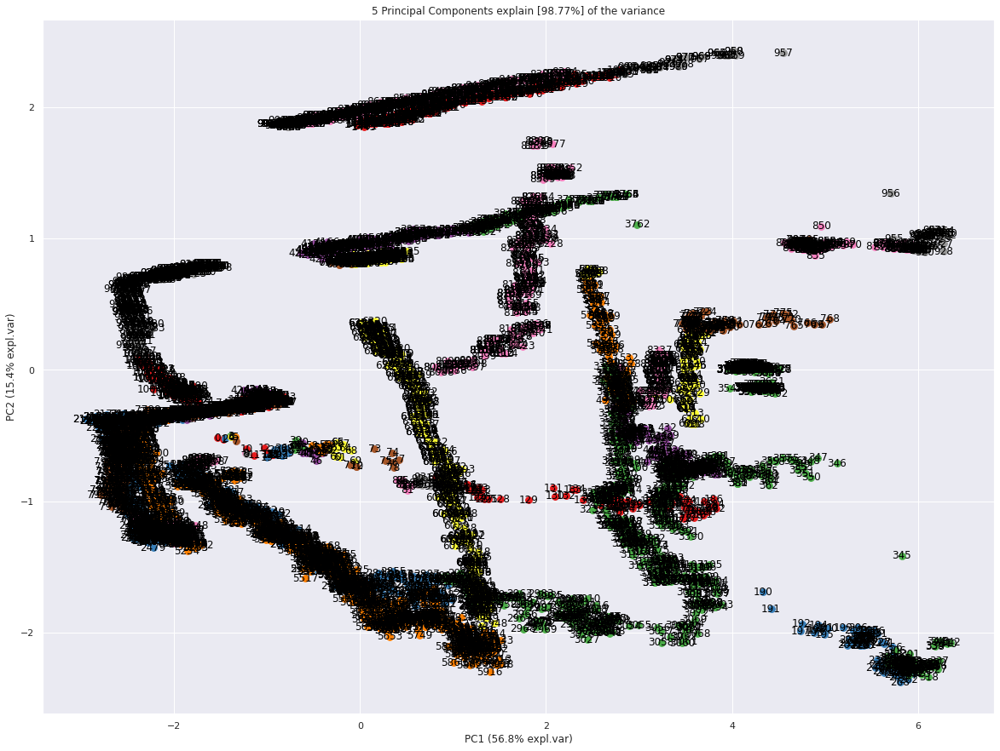

In [38]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [39]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5
S1_Temp,0.440613,0.146444,-0.084366,0.282093,-0.072115
S2_Temp,0.401410,-0.005765,0.120680,0.287767,0.620877
S3_Temp,0.449247,0.128212,-0.084380,0.071409,-0.071528
S4_Temp,0.420034,-0.081459,-0.334700,0.032018,0.092572
S3_Light,0.355915,-0.360989,0.241208,0.120548,-0.710191
S4_Light,0.214808,-0.634820,0.295484,-0.541502,0.280170
day_type,0.116245,0.482609,0.801826,-0.068469,0.003017
Time_of_day,0.283105,0.435001,-0.266002,-0.720448,-0.112916


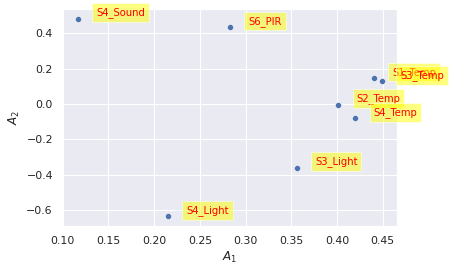

In [40]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))
 

**Scree Plot**

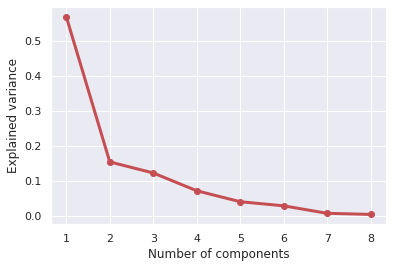

In [41]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

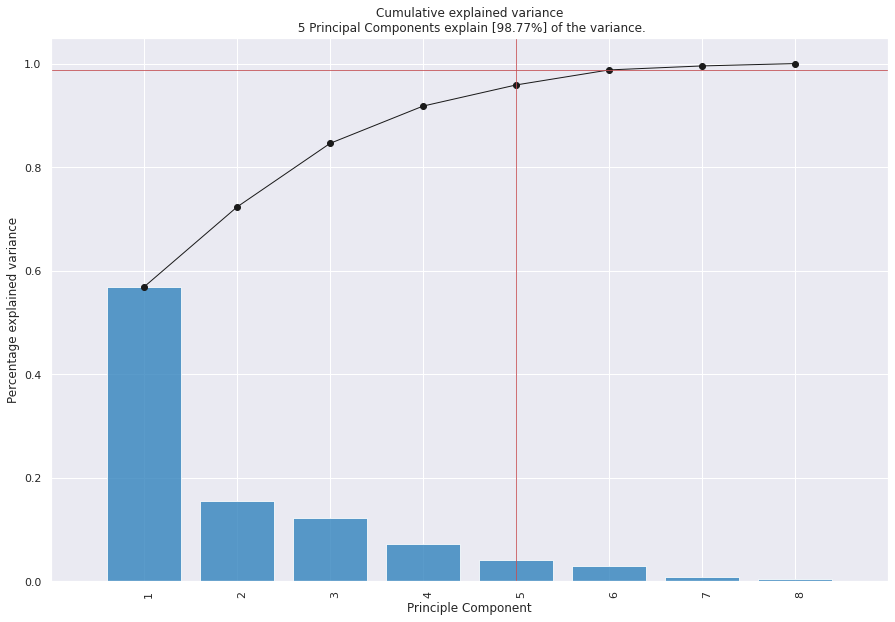

<Figure size 432x288 with 0 Axes>

In [42]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [10129] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [10129] unique colors! Available unique colors: [9].
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


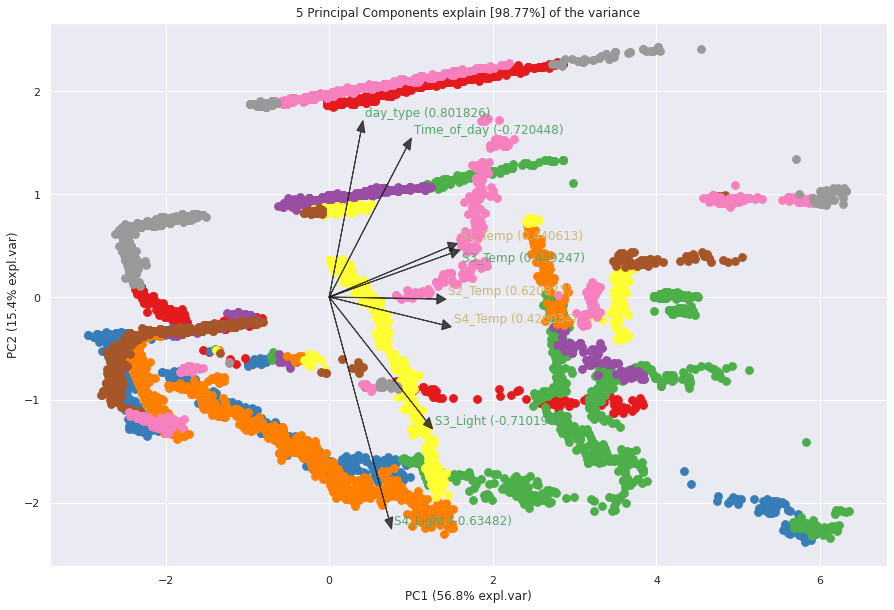

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fae56eea910>)

In [43]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [10129] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [10129] unique colors! Available unique colors: [9].
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


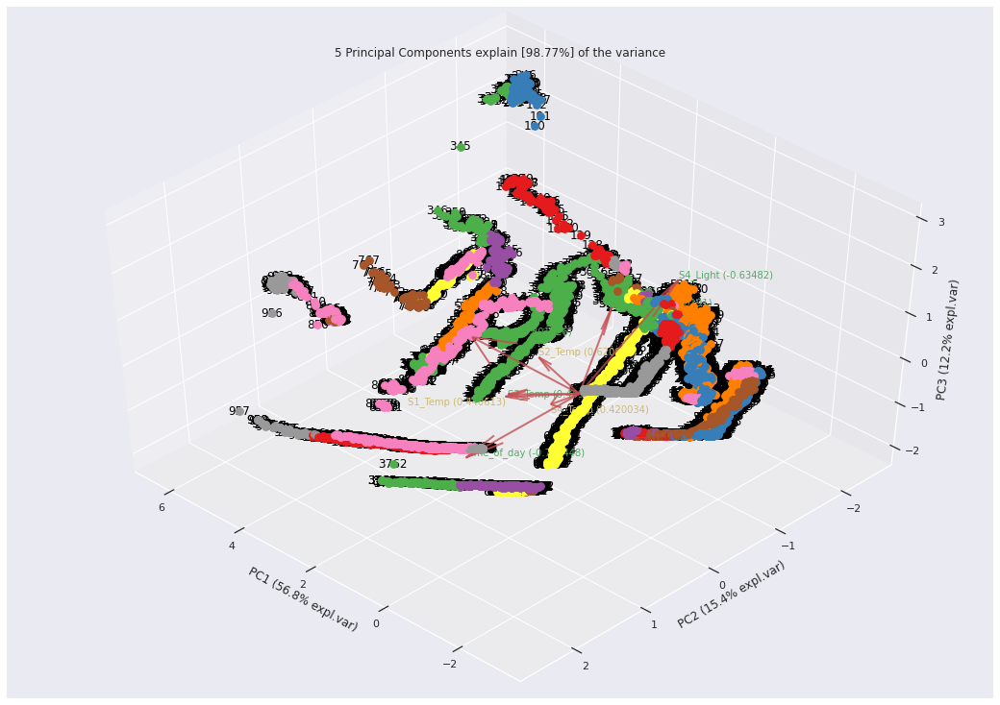

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7fae50752640>)

In [44]:
model.biplot3d(legend=False)

# Classification using Pycaret
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found. 
Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

 However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA.

In [45]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

In [46]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [47]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (9116, 12)
Unseen Data For Predictions: (1013, 12)


In [48]:
from pycaret.classification import *
clf = setup(data=data, target='Room_Occupancy_Count', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,Room_Occupancy_Count
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(9116, 12)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Room_Occupancy_Count',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('c

**Comparing All Models**

In [49]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9981,0.9992,0.9950,0.9950,0.9950,0.9939,0.9939,0.170
rf,Random Forest Classifier,0.9978,0.9999,0.9950,0.9934,0.9942,0.9928,0.9929,0.286
et,Extra Trees Classifier,0.9976,0.9995,0.9975,0.9902,0.9938,0.9924,0.9924,0.245
ada,Ada Boost Classifier,0.9975,0.9993,0.9925,0.9942,0.9934,0.9918,0.9918,0.176
gbc,Gradient Boosting Classifier,0.9964,0.9997,0.9884,0.9925,0.9904,0.9882,0.9882,0.405
dt,Decision Tree Classifier,0.9955,0.9918,0.9859,0.9901,0.9879,0.9851,0.9852,0.017
knn,K Neighbors Classifier,0.9875,0.9967,0.9519,0.9814,0.9662,0.9586,0.9589,0.100
lr,Logistic Regression,0.9665,0.9956,0.8921,0.9274,0.9092,0.8886,0.8890,0.922
ridge,Ridge Classifier,0.9622,0.0000,0.8589,0.9360,0.8955,0.8726,0.8739,0.013
lda,Linear Discriminant Analysis,0.9611,0.9941,0.8696,0.9204,0.8941,0.8703,0.8710,0.038


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:compare_models() succesfully completed......................................


In [50]:
best_model

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

 Create a Model

**Logistic Regresssion**

In [51]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9734,0.9958,0.9174,0.9407,0.9289,0.9125,0.9126
1,0.9749,0.9973,0.9333,0.9333,0.9333,0.9179,0.9179
2,0.9765,0.9975,0.9167,0.9565,0.9362,0.9218,0.9221
3,0.9702,0.9965,0.9000,0.9391,0.9191,0.9009,0.9012
4,0.9624,0.9961,0.8750,0.9211,0.8974,0.8744,0.8749
5,0.9545,0.9940,0.8667,0.8889,0.8776,0.8497,0.8498
6,0.9734,0.9960,0.9167,0.9402,0.9283,0.9119,0.9120
7,0.9561,0.9945,0.8595,0.9043,0.8814,0.8545,0.8549
8,0.9718,0.9955,0.9174,0.9328,0.9250,0.9076,0.9077
9,0.9514,0.9928,0.8182,0.9167,0.8646,0.8351,0.8371


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune the model**

In [52]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9765,0.9965,0.9256,0.9492,0.9372,0.9228,0.9229
1,0.9843,0.9985,0.9750,0.9435,0.9590,0.9493,0.9495
2,0.9812,0.9978,0.9417,0.9576,0.9496,0.9380,0.9381
3,0.9781,0.9971,0.9250,0.9569,0.9407,0.9272,0.9274
4,0.9749,0.9968,0.9250,0.9407,0.9328,0.9174,0.9174
5,0.9734,0.9965,0.9250,0.9328,0.9289,0.9125,0.9125
6,0.9843,0.9957,0.9333,0.9825,0.9573,0.9477,0.9481
7,0.9812,0.9960,0.9256,0.9739,0.9492,0.9376,0.9381
8,0.9749,0.9952,0.9256,0.9412,0.9333,0.9179,0.9179
9,0.9671,0.9942,0.8843,0.9386,0.9106,0.8905,0.8911


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [53]:
tuned_lr

LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate Logistic Regression**


In [54]:
evaluate_model(tuned_lr)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create model with K-nearest neighbour**

In [55]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9875,0.9983,0.9587,0.9748,0.9667,0.9590,0.9590
1,0.9890,0.9954,0.9583,0.9829,0.9705,0.9637,0.9638
2,0.9906,0.9944,0.9667,0.9831,0.9748,0.9690,0.9691
3,0.9906,0.9996,0.9667,0.9831,0.9748,0.9690,0.9691
4,0.9843,0.9991,0.9667,0.9508,0.9587,0.9490,0.9491
5,0.9875,0.9993,0.9500,0.9828,0.9661,0.9584,0.9586
6,0.9922,0.9994,0.9667,0.9915,0.9789,0.9741,0.9742
7,0.9875,0.9997,0.9339,1.0000,0.9658,0.9581,0.9590
8,0.9843,0.9907,0.9421,0.9744,0.9580,0.9484,0.9486
9,0.9812,0.9911,0.9091,0.9910,0.9483,0.9368,0.9381


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tune model with K-nearest neighbour**

In [56]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9875,0.9996,0.9504,0.9829,0.9664,0.9587,0.9589
1,0.9984,0.9957,0.9917,1.0000,0.9958,0.9949,0.9949
2,0.9937,0.9996,0.9833,0.9833,0.9833,0.9795,0.9795
3,0.9953,1.0000,0.9750,1.0000,0.9873,0.9845,0.9846
4,0.9906,0.9995,0.9667,0.9831,0.9748,0.9690,0.9691
5,0.9937,0.9999,0.9750,0.9915,0.9832,0.9793,0.9794
6,0.9937,0.9996,0.9667,1.0000,0.9831,0.9792,0.9794
7,0.9969,1.0000,0.9835,1.0000,0.9917,0.9897,0.9898
8,0.9906,0.9912,0.9587,0.9915,0.9748,0.9690,0.9692
9,0.9875,0.9953,0.9339,1.0000,0.9658,0.9581,0.9590


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


In [57]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')

**Evaluate model with K-nearest neighbour**

In [58]:
evaluate_model(tuned_knn)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create model with Quadratic Discriminant Analysis**

In [59]:
qda=create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8106,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8119,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9404,0.8731,0.7250,0.9457,0.8208,0.7858,0.7958
3,0.8511,0.6325,0.2750,0.8049,0.4099,0.3474,0.4136
4,0.8856,0.9708,0.9417,0.6313,0.7559,0.6849,0.7082
5,0.6395,0.9772,1.0000,0.3429,0.5106,0.3202,0.4366
6,0.5831,0.9856,1.0000,0.3109,0.4743,0.2627,0.3889
7,0.8103,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.6144,0.7621,1.0000,0.3297,0.4959,0.2947,0.4157
9,0.6207,0.7660,1.0000,0.3333,0.5000,0.3012,0.4211


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)
INFO:logs:create_model() succesfully completed......................................


**Tune QDA Model**

In [60]:
tuned_qda=tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9421,0.9846,0.8512,0.8443,0.8477,0.8120,0.8120
1,0.9436,0.9896,0.8333,0.8621,0.8475,0.8129,0.8130
2,0.9561,0.9916,0.8500,0.9107,0.8793,0.8525,0.8533
3,0.9530,0.9873,0.8833,0.8689,0.8760,0.8470,0.8471
4,0.9451,0.9847,0.8250,0.8761,0.8498,0.8163,0.8168
5,0.9373,0.9807,0.8500,0.8226,0.8361,0.7973,0.7975
6,0.9467,0.9870,0.8333,0.8772,0.8547,0.8221,0.8225
7,0.9389,0.9836,0.8512,0.8306,0.8408,0.8030,0.8031
8,0.9451,0.9885,0.8347,0.8707,0.8523,0.8187,0.8189
9,0.9436,0.9837,0.8182,0.8761,0.8462,0.8117,0.8124


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate QDA Model**

In [61]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)

In [62]:
evaluate_model(tuned_qda)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [63]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# **Classification + PCA**

In [64]:
clf_pca = setup(data=data, target='Room_Occupancy_Count', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,Room_Occupancy_Count
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(9116, 12)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Room_Occupancy_Count',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None...
                ('fix_perfect', Remove_100(target='Room_Occupancy_Count')),
                ('clean_names', Clean_Colum_Names()),
                ('feature_select', 'pas

# **Comparing Models**

In [65]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9925,0.9985,0.9759,0.9843,0.9800,0.9753,0.9754,0.239
knn,K Neighbors Classifier,0.9919,0.9944,0.9701,0.9866,0.9782,0.9732,0.9733,0.065
lightgbm,Light Gradient Boosting Machine,0.9919,0.9990,0.9743,0.9827,0.9783,0.9733,0.9734,0.087
rf,Random Forest Classifier,0.9912,0.9979,0.9759,0.9779,0.9768,0.9714,0.9715,0.666
gbc,Gradient Boosting Classifier,0.9865,0.9975,0.9527,0.9755,0.9639,0.9556,0.9557,0.581
dt,Decision Tree Classifier,0.9856,0.9761,0.9610,0.9629,0.9618,0.9529,0.9530,0.036
ada,Ada Boost Classifier,0.9702,0.9903,0.8995,0.9409,0.9195,0.9013,0.9018,0.181
svm,SVM - Linear Kernel,0.9459,0.0000,0.7667,0.9401,0.8418,0.8097,0.8177,0.056
lr,Logistic Regression,0.9274,0.9794,0.7367,0.8597,0.7930,0.7493,0.7530,0.025
lda,Linear Discriminant Analysis,0.9207,0.9708,0.7400,0.8232,0.7786,0.7305,0.7326,0.022


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


# **Best model with PCA**

In [66]:
best_model_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

# **Tune Best Model**

In [67]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9577,0.9857,0.8760,0.8983,0.8870,0.8610,0.8612
1,0.9514,0.9901,0.8417,0.8938,0.8670,0.8373,0.8378
2,0.9592,0.9895,0.8333,0.9434,0.8850,0.8603,0.8628
3,0.9436,0.9855,0.7750,0.9118,0.8378,0.8040,0.8078
4,0.9592,0.9904,0.8417,0.9352,0.8860,0.8612,0.8630
5,0.9389,0.9834,0.7750,0.8857,0.8267,0.7898,0.7924
6,0.9734,0.9920,0.8833,0.9725,0.9258,0.9096,0.9111
7,0.9592,0.9898,0.8678,0.9130,0.8898,0.8649,0.8653
8,0.9671,0.9871,0.8595,0.9630,0.9083,0.8883,0.8904
9,0.9451,0.9829,0.7934,0.9057,0.8458,0.8126,0.8153


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


# **Evaluate Best Model**

In [68]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [69]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9155,0.9719,0.6777,0.8454,0.7523,0.7021,0.7083
1,0.9310,0.9851,0.7583,0.8585,0.8053,0.7636,0.7658
2,0.9436,0.9846,0.7750,0.9118,0.8378,0.8040,0.8078
3,0.9295,0.9780,0.7167,0.8866,0.7926,0.7507,0.7569
4,0.9248,0.9821,0.7000,0.8750,0.7778,0.7332,0.7398
5,0.9169,0.9753,0.7500,0.7965,0.7725,0.7218,0.7223
6,0.9326,0.9847,0.7583,0.8667,0.8089,0.7682,0.7707
7,0.9185,0.9780,0.7355,0.8165,0.7739,0.7244,0.7258
8,0.9326,0.9780,0.7603,0.8679,0.8106,0.7698,0.7723
9,0.9295,0.9760,0.7355,0.8725,0.7982,0.7558,0.7599


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


# **Tune Model**

In [70]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9155,0.9718,0.6777,0.8454,0.7523,0.7021,0.7083
1,0.9310,0.9852,0.7583,0.8585,0.8053,0.7636,0.7658
2,0.9451,0.9846,0.7833,0.9126,0.8430,0.8100,0.8135
3,0.9295,0.9783,0.7167,0.8866,0.7926,0.7507,0.7569
4,0.9248,0.9822,0.7000,0.8750,0.7778,0.7332,0.7398
5,0.9232,0.9754,0.7667,0.8142,0.7897,0.7428,0.7433
6,0.9342,0.9848,0.7583,0.8750,0.8125,0.7728,0.7757
7,0.9185,0.9779,0.7355,0.8165,0.7739,0.7244,0.7258
8,0.9326,0.9780,0.7603,0.8679,0.8106,0.7698,0.7723
9,0.9310,0.9758,0.7355,0.8812,0.8018,0.7605,0.7650


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


# **Evaluate Model**

In [71]:
tuned_lr_pca

LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [72]:
evaluate_model(tuned_lr_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create K-nearest neighbour Model**

In [73]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9890,0.9946,0.9504,0.9914,0.9705,0.9637,0.9641
1,0.9937,0.9999,0.9667,1.0000,0.9831,0.9792,0.9794
2,0.9922,0.9947,0.9667,0.9915,0.9789,0.9741,0.9742
3,0.9937,0.9915,0.9750,0.9915,0.9832,0.9793,0.9794
4,0.9937,0.9957,0.9750,0.9915,0.9832,0.9793,0.9794
5,0.9906,0.9905,0.9583,0.9914,0.9746,0.9688,0.9690
6,0.9969,0.9989,1.0000,0.9836,0.9917,0.9898,0.9899
7,0.9890,0.9914,0.9587,0.9831,0.9707,0.9640,0.9641
8,0.9906,0.9937,0.9835,0.9675,0.9754,0.9696,0.9696
9,0.9890,0.9934,0.9669,0.9750,0.9710,0.9642,0.9642


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


# **Tune Model**

In [74]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9922,0.9946,0.9669,0.9915,0.9791,0.9743,0.9744
1,0.9937,0.9999,0.9667,1.0000,0.9831,0.9792,0.9794
2,0.9922,0.9988,0.9667,0.9915,0.9789,0.9741,0.9742
3,0.9890,0.9913,0.9583,0.9829,0.9705,0.9637,0.9638
4,0.9953,0.9957,0.9833,0.9916,0.9874,0.9846,0.9846
5,0.9906,0.9946,0.9583,0.9914,0.9746,0.9688,0.9690
6,0.9953,0.9989,0.9917,0.9835,0.9876,0.9847,0.9847
7,0.9922,0.9954,0.9752,0.9833,0.9793,0.9744,0.9744
8,0.9890,0.9944,0.9835,0.9597,0.9714,0.9646,0.9648
9,0.9843,0.9943,0.9504,0.9664,0.9583,0.9487,0.9487


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=9, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


In [75]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=9, p=2,
                     weights='distance')

# **Evaluate Model KNN**

In [76]:
evaluate_model(tuned_knn_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=9, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create Quadratic Discriminant Analysis Model**

In [77]:
qda_pca = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9077,0.9722,0.6777,0.8039,0.7354,0.6800,0.6836
1,0.9279,0.9851,0.7417,0.8558,0.7946,0.7512,0.7540
2,0.9326,0.9837,0.7167,0.9053,0.8000,0.7601,0.7676
3,0.9201,0.9764,0.7167,0.8350,0.7713,0.7232,0.7263
4,0.9154,0.9801,0.6583,0.8587,0.7453,0.6956,0.7044
5,0.9091,0.9762,0.7167,0.7818,0.7478,0.6925,0.6935
6,0.9232,0.9825,0.7083,0.8586,0.7763,0.7304,0.7353
7,0.9138,0.9777,0.7107,0.8113,0.7577,0.7056,0.7078
8,0.9295,0.9806,0.7521,0.8585,0.8018,0.7591,0.7616
9,0.9154,0.9759,0.6777,0.8454,0.7523,0.7020,0.7082


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)
INFO:logs:create_model() succesfully completed......................................


# **Tune model**

In [78]:
tuned_qda_pca = tune_model(qda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9249,0.9613,0.8595,0.7704,0.8125,0.7657,0.7675
1,0.9279,0.9664,0.8500,0.7846,0.8160,0.7713,0.7722
2,0.9451,0.9661,0.8500,0.8571,0.8536,0.8198,0.8198
3,0.9216,0.9556,0.7917,0.7917,0.7917,0.7434,0.7434
4,0.9342,0.9692,0.8333,0.8197,0.8264,0.7858,0.7859
5,0.9075,0.9560,0.7833,0.7402,0.7611,0.7039,0.7043
6,0.9342,0.9741,0.8833,0.7910,0.8346,0.7937,0.7956
7,0.9357,0.9622,0.8678,0.8077,0.8367,0.7967,0.7975
8,0.9342,0.9650,0.8760,0.7970,0.8346,0.7937,0.7950
9,0.9122,0.9570,0.7934,0.7559,0.7742,0.7198,0.7201


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:QuadraticDiscriminantAnalysis(priors=None, reg_param=0.98,
                              store_covariance=False, tol=0.0001)
INFO:logs:tune_model() succesfully completed......................................


# **Evaluate Model**

In [79]:
tuned_qda_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.98,
                              store_covariance=False, tol=0.0001)

In [80]:
evaluate_model(tuned_qda_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=QuadraticDiscriminantAnalysis(priors=None, reg_param=0.98,
                              store_covariance=False, tol=0.0001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# Explainable AI with Shapley values
For binary classification, AI shapley can only support tree based classification models. As none of the the best three models with highest accuracy (LR, KNN, QDA) based on tree, I chose the fourth best model "Extra trees classifier" for the AI Shapley analysis.

In [81]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9875,0.9980,0.9504,0.9829,0.9664,0.9587,0.9589
1,0.9922,0.9998,0.9667,0.9915,0.9789,0.9741,0.9742
2,0.9922,0.9995,0.9667,0.9915,0.9789,0.9741,0.9742
3,0.9890,0.9991,0.9667,0.9748,0.9707,0.9640,0.9640
4,0.9969,1.0000,0.9833,1.0000,0.9916,0.9897,0.9897
5,0.9937,0.9991,0.9750,0.9915,0.9832,0.9793,0.9794
6,0.9953,0.9999,1.0000,0.9756,0.9877,0.9848,0.9849
7,0.9969,0.9988,0.9835,1.0000,0.9917,0.9897,0.9898
8,0.9922,0.9927,0.9917,0.9677,0.9796,0.9747,0.9749
9,0.9890,0.9982,0.9752,0.9672,0.9712,0.9644,0.9644


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [82]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9577,0.9857,0.8760,0.8983,0.8870,0.8610,0.8612
1,0.9514,0.9901,0.8417,0.8938,0.8670,0.8373,0.8378
2,0.9592,0.9895,0.8333,0.9434,0.8850,0.8603,0.8628
3,0.9436,0.9855,0.7750,0.9118,0.8378,0.8040,0.8078
4,0.9592,0.9904,0.8417,0.9352,0.8860,0.8612,0.8630
5,0.9389,0.9834,0.7750,0.8857,0.8267,0.7898,0.7924
6,0.9734,0.9920,0.8833,0.9725,0.9258,0.9096,0.9111
7,0.9592,0.9898,0.8678,0.9130,0.8898,0.8649,0.8653
8,0.9671,0.9871,0.8595,0.9630,0.9083,0.8883,0.8904
9,0.9451,0.9829,0.7934,0.9057,0.8458,0.8126,0.8153


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [83]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

In [84]:
evaluate_model(tuned_et_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [85]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [86]:
import shap

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


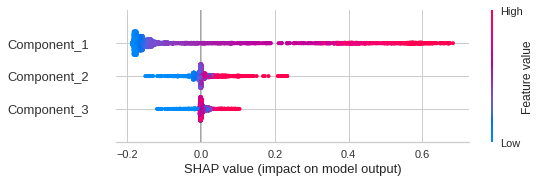

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [87]:
interpret_model(tuned_et_pca, plot='summary')


In [88]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [89]:
interpret_model(tuned_et_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
